In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import ast

In [2]:
folder = '../archive/'

In [58]:
papers = pd.read_csv(folder+'papers_new.csv')

In [4]:
papers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20216 entries, 0 to 20215
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   pid                   20216 non-null  int64  
 1   title                 20215 non-null  object 
 2   pub_date              16099 non-null  object 
 3   abstract              19551 non-null  object 
 4   language              20209 non-null  object 
 5   ref_count             19805 non-null  float64
 6   citedby_count         20212 non-null  float64
 7   corresponding_author  17804 non-null  float64
 8   author_id             20216 non-null  object 
 9   subject_areas_id      20216 non-null  object 
 10  keywords              16454 non-null  object 
 11  idxterms              11572 non-null  object 
 12  classification_code   20216 non-null  object 
 13  cor_country           17814 non-null  object 
 14  cor_city              16626 non-null  object 
 15  subject_areas      

In [6]:
papers[['language']].value_counts()

language  
English       20187
Spanish           8
Thai              5
Chinese           3
French            2
Japanese          2
Portuguese        1
Russian           1
Name: count, dtype: int64

       cor_country  count
0         Thailand  13633
1    United States    895
2            Japan    452
3            China    353
4   United Kingdom    264
5        Australia    228
6            India    213
7         Malaysia    140
8          Germany    121
9           Taiwan    116
10       Indonesia    105
11          Canada    104
12     South Korea    102
13        Viet Nam     93
14       Singapore     77
15          France     67
16       Hong Kong     60
17          Brazil     58
18        Pakistan     52
19     Netherlands     52


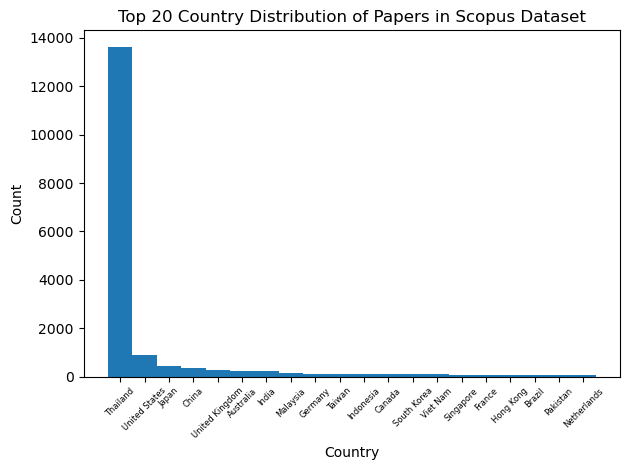

In [26]:
top_countries = papers[['cor_country']].value_counts().nlargest(20).reset_index()
print(top_countries)
plt.bar(top_countries['cor_country'], top_countries['count'], width=1)
plt.title('Top 20 Country Distribution of Papers in Scopus Dataset')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45, fontsize=6)
plt.tight_layout()
plt.show()

In [64]:
# Flatten all lists into a single list
papers['subject_areas'] = papers['subject_areas']
# Flatten all lists into a single list
# for p in papers['subject_areas'].apply(ast.literal_eval):
#     for x in p:
#         print(x)
all_items = [item for sublist in papers['subject_areas'].apply(ast.literal_eval) for item in sublist]


# Count occurrences of each unique item
item_counts = Counter(all_items)

# Convert Counter to a DataFrame for better visualization (optional)
counts_df = pd.DataFrame(item_counts.items(), columns=['Item', 'Count']).sort_values(by='Count', ascending=False)

Dermatology
Computer Science (miscellaneous)
Algebra and Number Theory
Statistics and Probability
Numerical Analysis
Modeling and Simulation
Discrete Mathematics and Combinatorics
Computational Mathematics
Applied Mathematics
Physiology
Ecology
Immunology and Microbiology (all)
Genetics
Microbiology (medical)
Cell Biology
Infectious Diseases
Advanced and Specialized Nursing
Anesthesiology and Pain Medicine
Anatomy
Microbiology
Microbiology (medical)
Finance
Economics and Econometrics
Insect Science
Conservation
Architecture
Visual Arts and Performing Arts
Gastroenterology
Agricultural and Biological Sciences (all)
Surgery
Oral Surgery
Otorhinolaryngology
Education
Business, Management and Accounting (all)
Strategy and Management
Management of Technology and Innovation
Neurology (clinical)
Anesthesiology and Pain Medicine
Immunology and Allergy
Immunology
Environmental Engineering
Environmental Chemistry
Chemistry (all)
Pollution
Public Health, Environmental and Occupational Health
Heal

In [68]:
top_20_counts_df = counts_df.nlargest(20, 'Count')

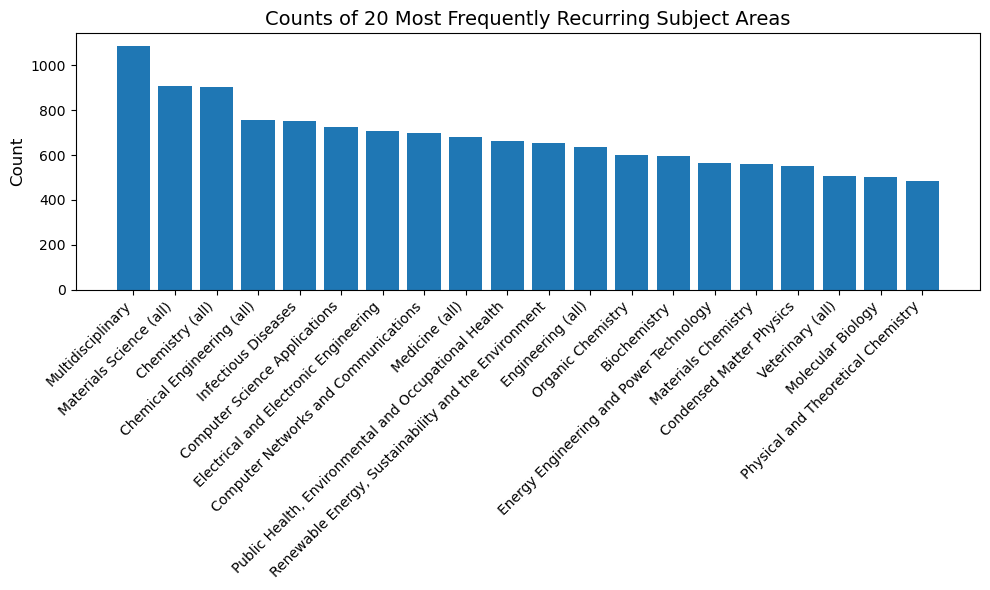

In [71]:
# Plotting the data
plt.figure(figsize=(10, 6))
plt.bar(top_20_counts_df['Item'], top_20_counts_df['Count'])
plt.ylabel('Count', fontsize=12)
plt.title('Counts of 20 Most Frequently Recurring Subject Areas', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()

In [44]:
subject_areas.plot(kind='bar')
plt.title('Top 20 Most Frequently Recurring Subject Areas')
plt.xlabel('Subject Area')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.subplots_adjust(bottom=0.3)
plt.show()

/var/folders/hy/4rbd3xkx3z596480zrt_f6kc0000gn/T/ipykernel_21448/3822100239.py:6: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
